In [98]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from itertools import combinations
from tabulate import tabulate

# Load and investigate the data
tennis = pd.read_csv('tennis_stats.csv')
tennis.head()

,Player,Year,FirstServe,FirstServePointsWon,FirstServeReturnPointsWon,SecondServePointsWon,SecondServeReturnPointsWon,Aces,BreakPointsConverted,BreakPointsFaced,...,ReturnGamesWon,ReturnPointsWon,ServiceGamesPlayed,ServiceGamesWon,TotalPointsWon,TotalServicePointsWon,Wins,Losses,Winnings,Ranking
0,Pedro Sousa,2016,0.88,0.50,0.38,0.50,0.39,0,0.14,7,...,0.11,0.38,8,0.50,0.43,0.50,1,2,39820,119
1,Roman Safiullin,2017,0.84,0.62,0.26,0.33,0.07,7,0.00,7,...,0.00,0.20,9,0.67,0.41,0.57,0,1,17334,381
2,Pedro Sousa,2017,0.83,0.60,0.28,0.53,0.44,2,0.38,10,...,0.16,0.34,17,0.65,0.45,0.59,4,1,109827,119
3,Rogerio Dutra Silva,2010,0.83,0.64,0.34,0.59,0.33,2,0.33,5,...,0.14,0.34,15,0.80,0.49,0.63,0,0,9761,125
4,Daniel Gimeno-Traver,2017,0.81,0.54,0.00,0.33,0.33,1,0.00,2,...,0.00,0.20,2,0.50,0.35,0.50,0,1,32879,272


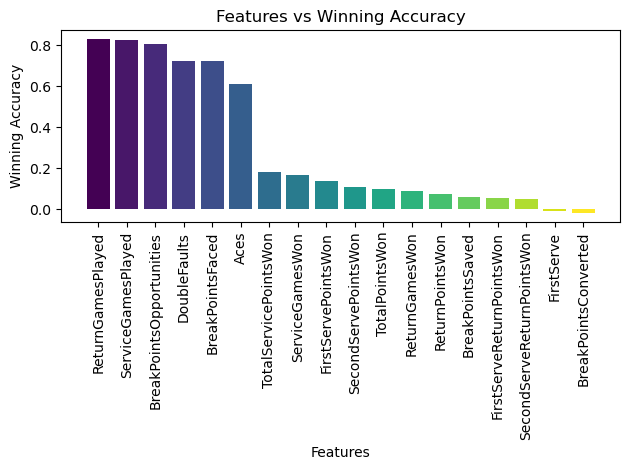

In [99]:
X_list = ['FirstServe', 'FirstServePointsWon', 'FirstServeReturnPointsWon',
          'SecondServePointsWon', 'SecondServeReturnPointsWon', 'Aces',
          'BreakPointsConverted', 'BreakPointsFaced', 'BreakPointsOpportunities',
          'BreakPointsSaved', 'DoubleFaults', 'ReturnGamesPlayed', 'ReturnGamesWon',
          'ReturnPointsWon', 'ServiceGamesPlayed', 'ServiceGamesWon', 'TotalPointsWon',
          'TotalServicePointsWon']

accuracy_dict = {}  # Dictionary to store feature vs accuracy pairs

for i, string in enumerate(X_list):
    features = tennis[[string]]
    outcome = tennis[['Winnings']]
    features_train, features_test, outcome_train, outcome_test = train_test_split(features, outcome, train_size=0.8, test_size=0.2)
    
    model = LinearRegression()
    model.fit(features_train, outcome_train)
    accuracy = model.score(features_test, outcome_test)
    
    accuracy_dict[string] = accuracy

# Sort the accuracy dictionary by accuracy in descending order
sorted_accuracy_dict = dict(sorted(accuracy_dict.items(), key=lambda item: item[1], reverse=True))

# Create a colormap for the bar plot with color intensity based on accuracy
colormap = plt.get_cmap('viridis', len(sorted_accuracy_dict))
colors = [colormap(i) for i in range(len(sorted_accuracy_dict))]

# Plot the sorted accuracy values with colored bars
plt.bar(sorted_accuracy_dict.keys(), sorted_accuracy_dict.values(), color=colors)
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Winning Accuracy")
plt.title("Features vs Winning Accuracy")
plt.tight_layout()
plt.show()

In [100]:
# Create a DataFrame from the sorted_accuracy_dict
sorted_accuracy_df = pd.DataFrame(sorted_accuracy_dict.items(), columns=['Features', 'Winning Accuracy'])

# Print the DataFrame
print("Features vs Winning Accuracy:")
sorted_accuracy_df

Features vs Winning Accuracy:


,Features,Winning Accuracy
0,ReturnGamesPlayed,0.830502
1,ServiceGamesPlayed,0.825135
2,BreakPointsOpportunities,0.805133
3,DoubleFaults,0.725329
4,BreakPointsFaced,0.723243
5,Aces,0.613263
6,TotalServicePointsWon,0.180739
7,ServiceGamesWon,0.167410
8,FirstServePointsWon,0.139490
9,SecondServePointsWon,0.107753


By using accuracy > 70% , `ServiceGamesPlayed`, `BreakPointsOpportunities`, `ReturnGamesPlayed`, `DoubleFaults` and  `BreakPointsFaced` are the best model to predict `Winnings`.

- Create a few linear regression models that use __two features__ to predict `Winnings`. 
- Which set of __two features__ results in the best model?

BreakPointsFaced and BreakPointsOpportunities vs Winnings Accuracy:
0.7821488810407995


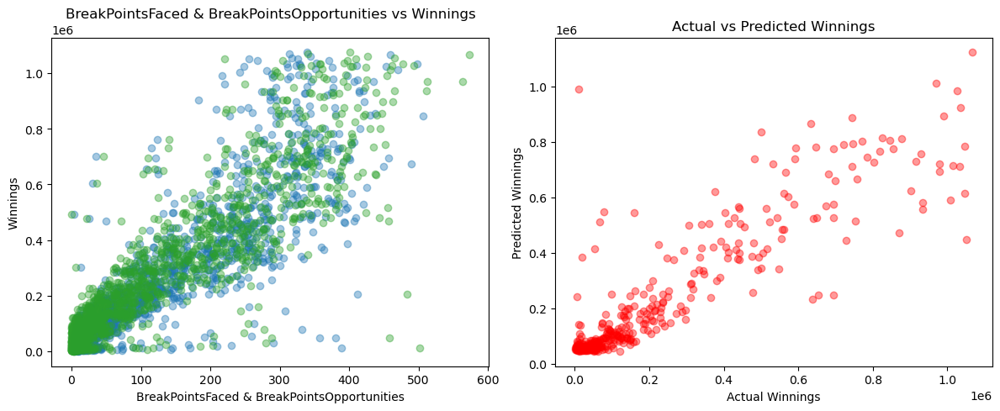

BreakPointsFaced and DoubleFaults vs Winnings Accuracy:
0.7741794906653249


<Figure size 640x480 with 0 Axes>

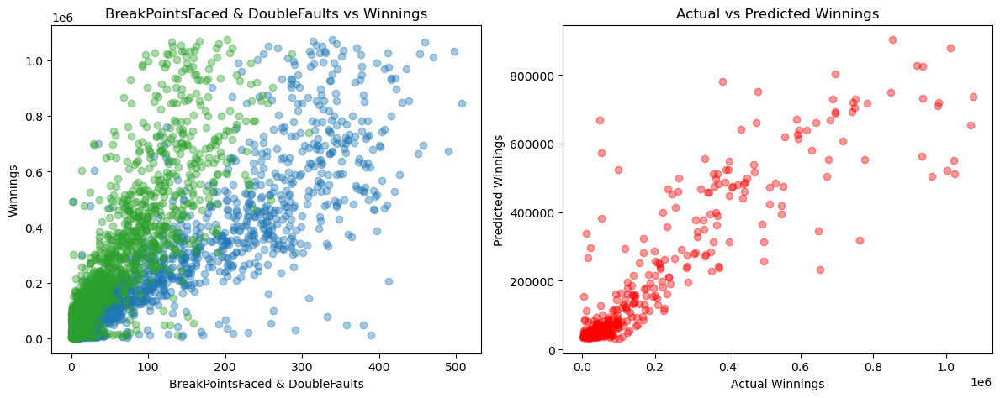

BreakPointsFaced and ReturnGamesPlayed vs Winnings Accuracy:
0.8490013033290562


<Figure size 640x480 with 0 Axes>

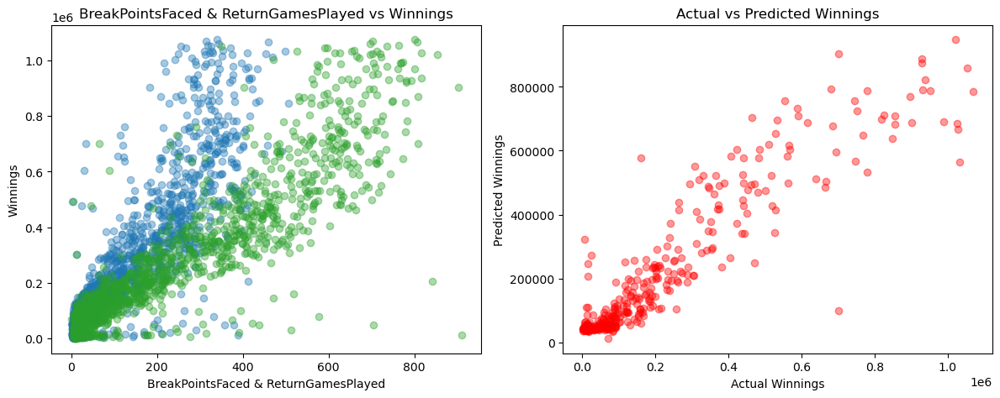

BreakPointsFaced and ServiceGamesPlayed vs Winnings Accuracy:
0.8599282700708446


<Figure size 640x480 with 0 Axes>

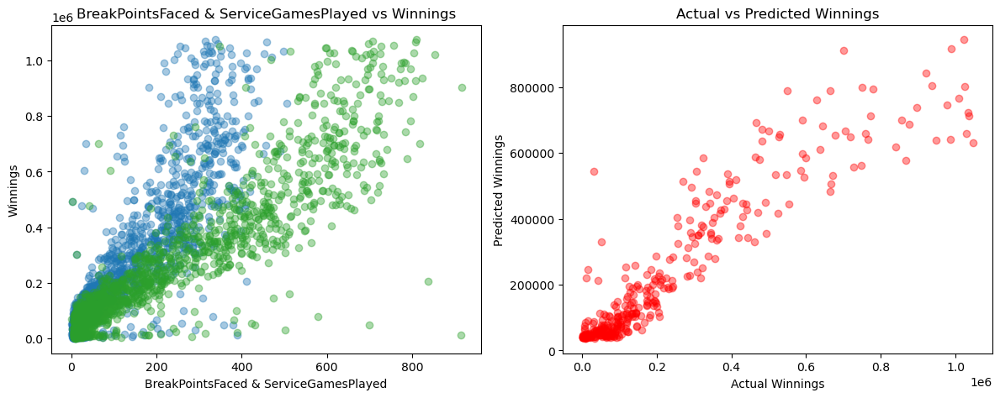

BreakPointsOpportunities and BreakPointsFaced vs Winnings Accuracy:
0.7798126126239582


<Figure size 640x480 with 0 Axes>

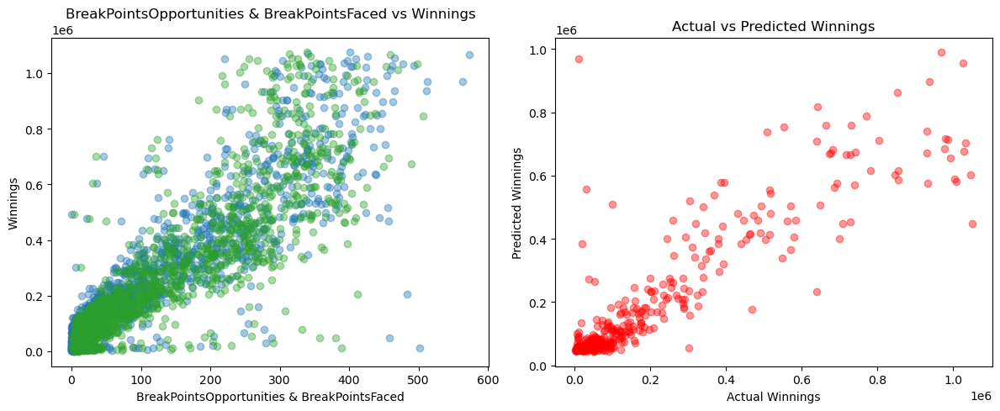

BreakPointsOpportunities and DoubleFaults vs Winnings Accuracy:
0.8094222393044517


<Figure size 640x480 with 0 Axes>

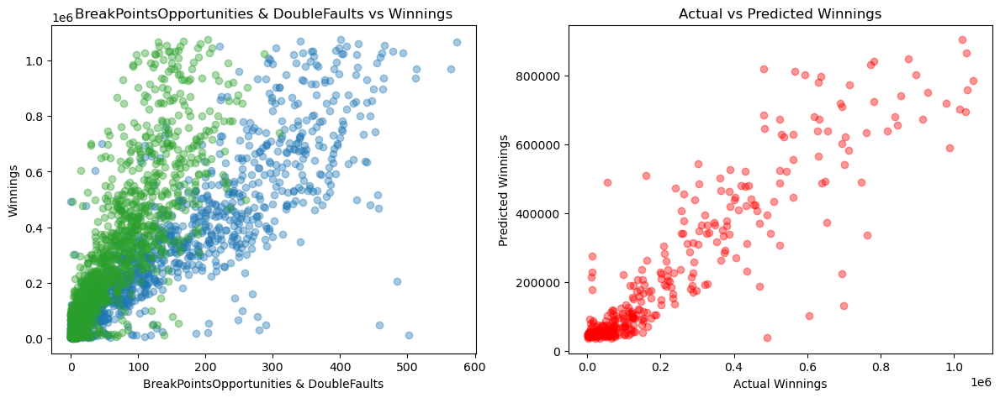

BreakPointsOpportunities and ReturnGamesPlayed vs Winnings Accuracy:
0.8483176310053634


<Figure size 640x480 with 0 Axes>

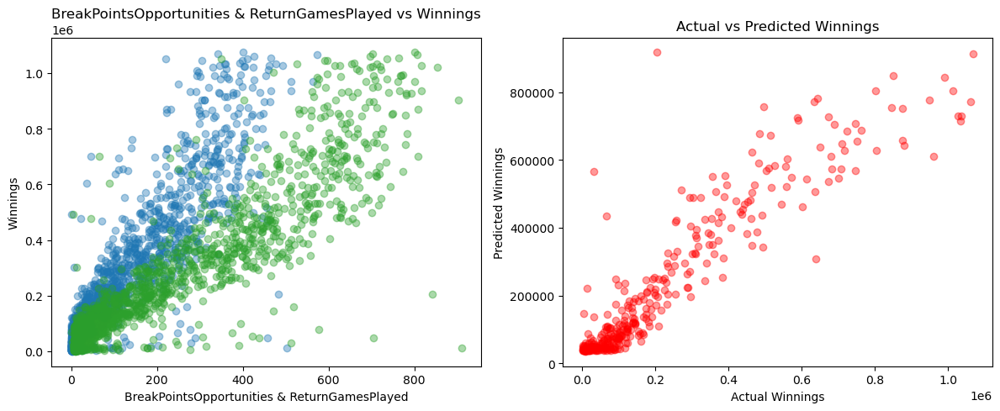

BreakPointsOpportunities and ServiceGamesPlayed vs Winnings Accuracy:
0.8404873769175598


<Figure size 640x480 with 0 Axes>

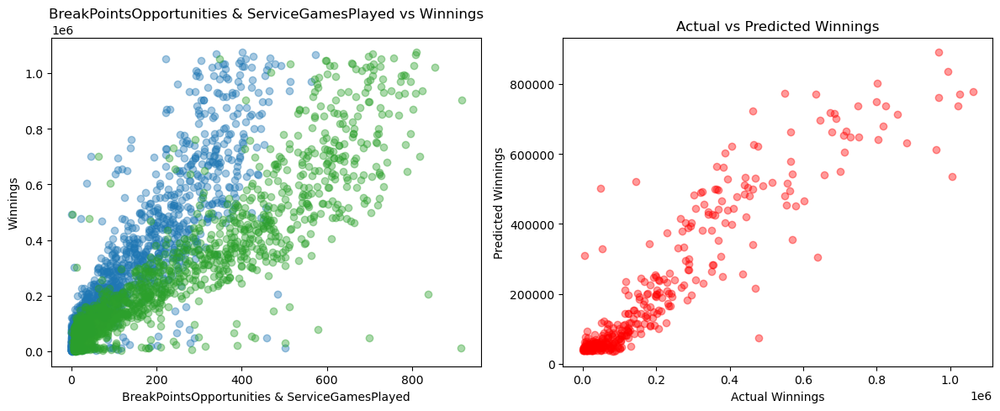

DoubleFaults and BreakPointsFaced vs Winnings Accuracy:
0.8040841254288149


<Figure size 640x480 with 0 Axes>

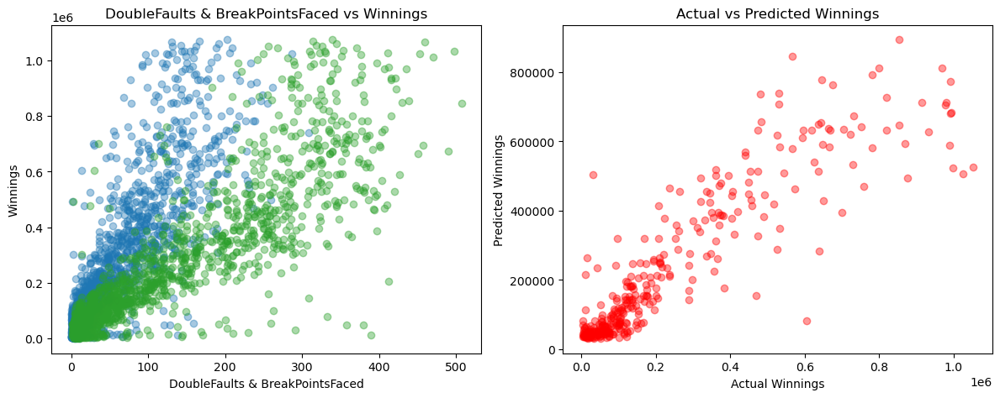

DoubleFaults and BreakPointsOpportunities vs Winnings Accuracy:
0.7816376687653868


<Figure size 640x480 with 0 Axes>

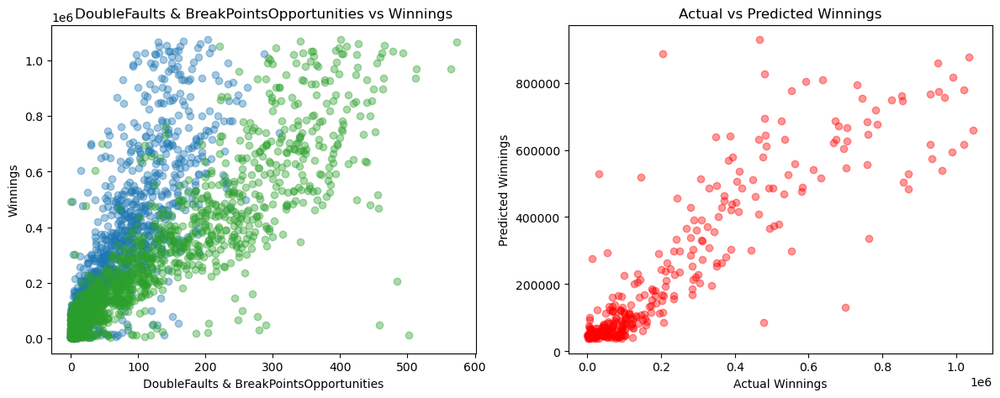

DoubleFaults and ReturnGamesPlayed vs Winnings Accuracy:
0.8587553576753156


<Figure size 640x480 with 0 Axes>

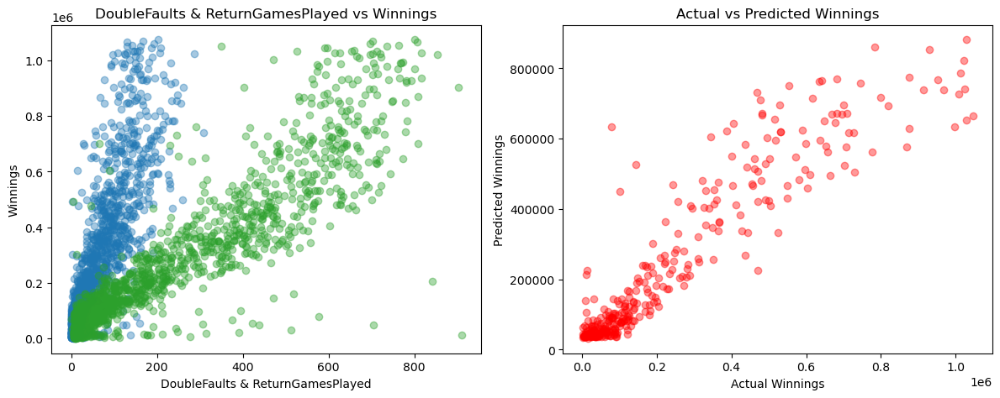

DoubleFaults and ServiceGamesPlayed vs Winnings Accuracy:
0.894133719368427


<Figure size 640x480 with 0 Axes>

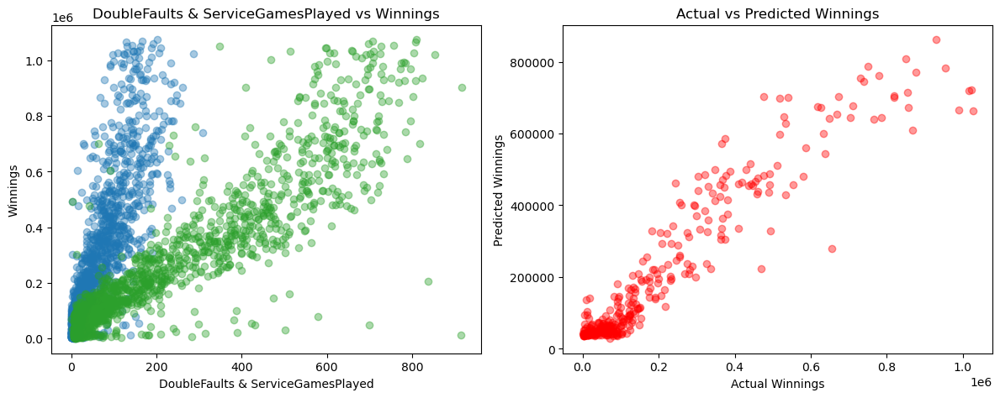

ReturnGamesPlayed and BreakPointsFaced vs Winnings Accuracy:
0.8309283406217792


<Figure size 640x480 with 0 Axes>

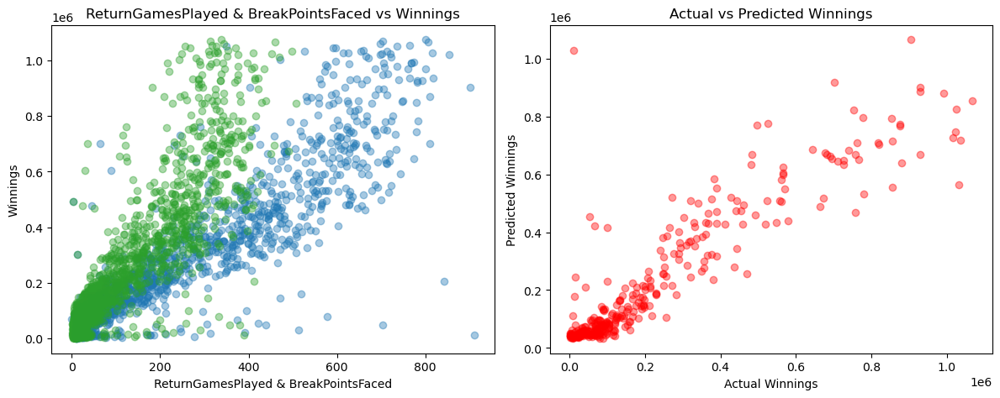

ReturnGamesPlayed and BreakPointsOpportunities vs Winnings Accuracy:
0.7945547134276048


<Figure size 640x480 with 0 Axes>

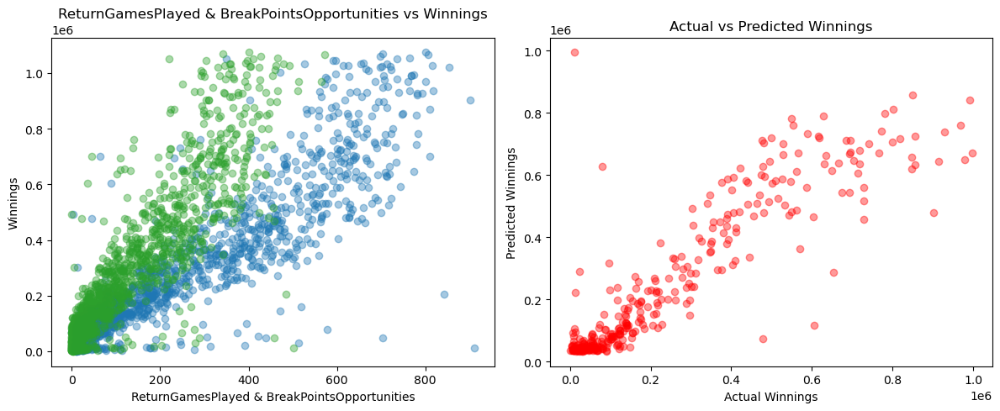

ReturnGamesPlayed and DoubleFaults vs Winnings Accuracy:
0.7944928585219181


<Figure size 640x480 with 0 Axes>

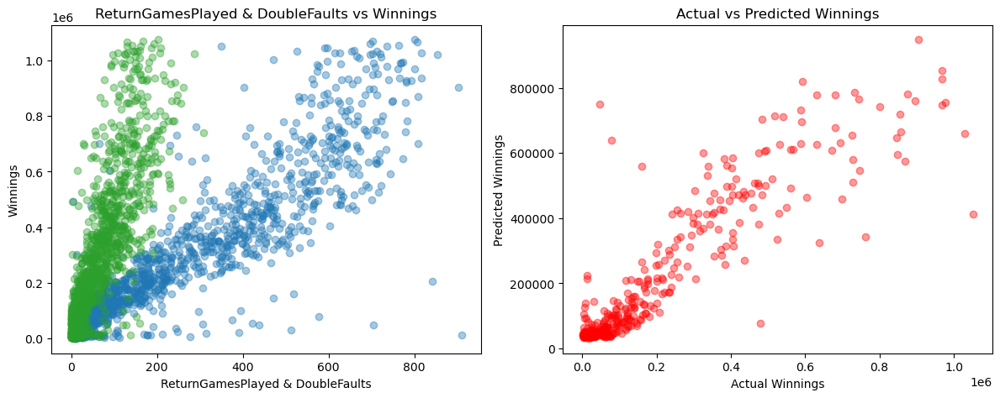

ReturnGamesPlayed and ServiceGamesPlayed vs Winnings Accuracy:
0.8436995020699186


<Figure size 640x480 with 0 Axes>

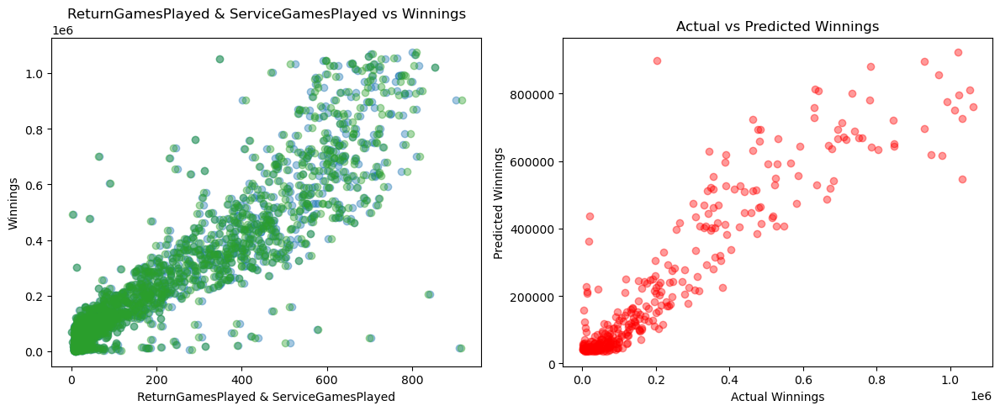

ServiceGamesPlayed and BreakPointsFaced vs Winnings Accuracy:
0.7811121537553649


<Figure size 640x480 with 0 Axes>

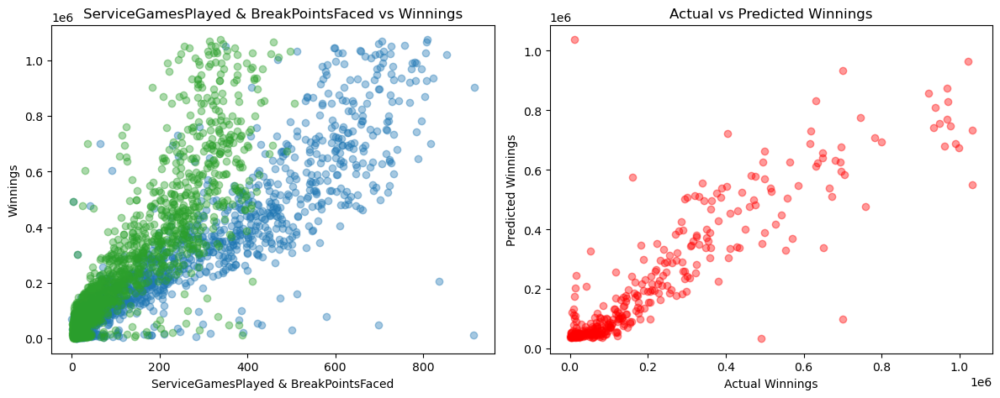

ServiceGamesPlayed and BreakPointsOpportunities vs Winnings Accuracy:
0.8717563484872126


<Figure size 640x480 with 0 Axes>

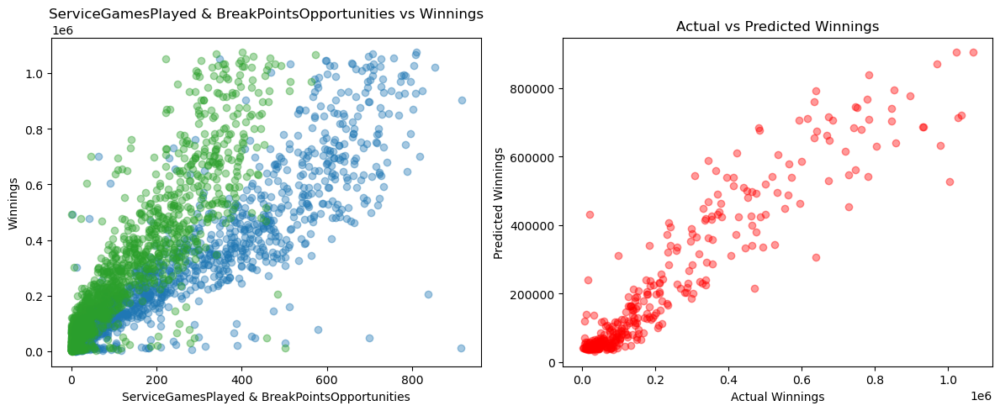

ServiceGamesPlayed and DoubleFaults vs Winnings Accuracy:
0.8434559335809273


<Figure size 640x480 with 0 Axes>

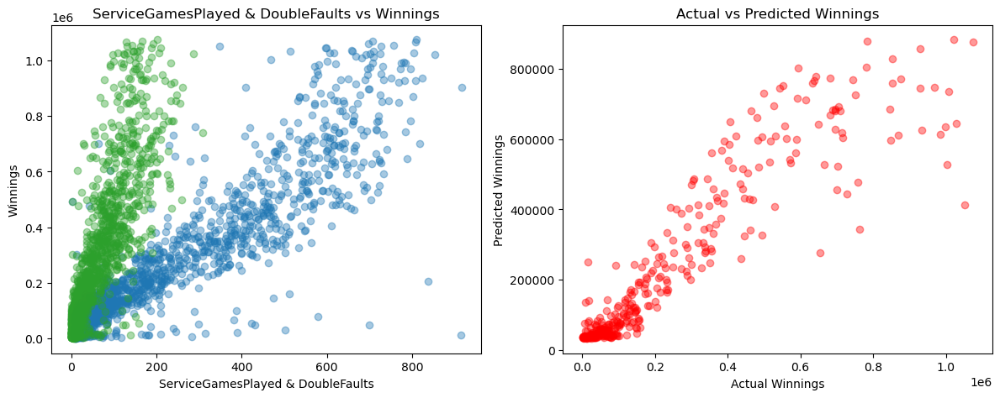

ServiceGamesPlayed and ReturnGamesPlayed vs Winnings Accuracy:
0.7987545943960022


<Figure size 640x480 with 0 Axes>

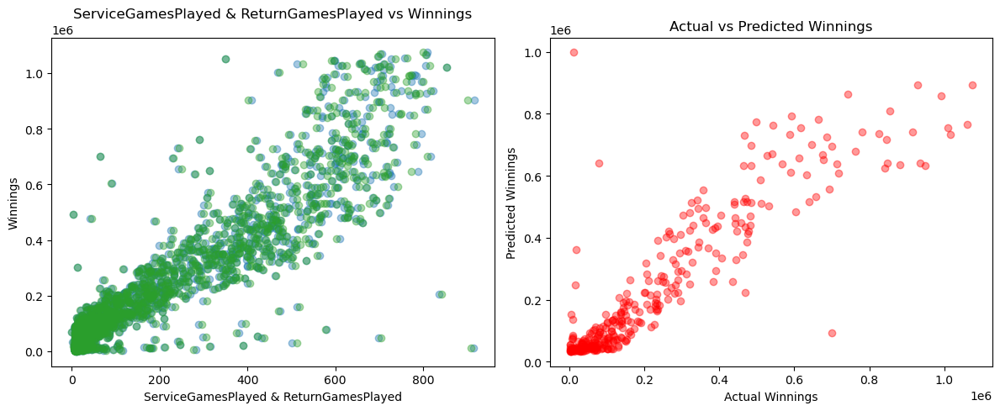

<Figure size 640x480 with 0 Axes>

In [101]:
first_predictors_list = ['BreakPointsFaced', 'BreakPointsOpportunities', 'DoubleFaults', 'ReturnGamesPlayed', 'ServiceGamesPlayed']
second_predictors_list = ['BreakPointsFaced', 'BreakPointsOpportunities', 'DoubleFaults', 'ReturnGamesPlayed', 'ServiceGamesPlayed']
accuracy_list = []

for first_predictor in first_predictors_list:
    for second_predictor in second_predictors_list:
        if first_predictor != second_predictor:
            features = tennis[[first_predictor, second_predictor]]
            outcome = tennis[['Winnings']]
            features_train, features_test, outcome_train, outcome_test = train_test_split(features, outcome, train_size=0.8, test_size=0.2)
            model = LinearRegression()
            model.fit(features_train, outcome_train)
            prediction = model.predict(features_test)
            accuracy = model.score(features_test, outcome_test)
            accuracy_list.append((first_predictor + " & " + second_predictor, accuracy))
            print(first_predictor + " and " + second_predictor + " vs Winnings Accuracy:")
            print(accuracy)
            
            # Adjust figure size for subplots
            plt.figure(figsize=(12, 5))  # Adjust the figure size here
            
            # Left column scatter plots
            plt.subplot(121)
            plt.scatter(tennis[first_predictor], tennis['Winnings'], color='#1f77b4', alpha=0.4)
            plt.scatter(tennis[second_predictor], tennis['Winnings'], color='#2ca02c', alpha=0.4)
            plt.title(first_predictor + " & " + second_predictor + ' vs Winnings')
            plt.xlabel(first_predictor + " & " + second_predictor)
            plt.ylabel('Winnings')
            
            # Right column scatter plots
            plt.subplot(122)
            plt.scatter(outcome_test, prediction, color='red', alpha=0.4)
            plt.title('Actual vs Predicted Winnings')
            plt.xlabel('Actual Winnings')
            plt.ylabel('Predicted Winnings')
            
            # Show the plots
            plt.tight_layout()
            plt.show()
            plt.clf()

In [102]:
# Sort accuracy_list by accuracy values in descending order
sorted_accuracy_list = sorted(accuracy_list, key=lambda x: x[1], reverse=True)

# Create a DataFrame from sorted_accuracy_list
sorted_accuracy_df = pd.DataFrame(sorted_accuracy_list, columns=['Predictor Combination', 'Accuracy'])

# Print the DataFrame
sorted_accuracy_df

,Predictor Combination,Accuracy
0,DoubleFaults & ServiceGamesPlayed,0.894134
1,ServiceGamesPlayed & BreakPointsOpportunities,0.871756
2,BreakPointsFaced & ServiceGamesPlayed,0.859928
3,DoubleFaults & ReturnGamesPlayed,0.858755
4,BreakPointsFaced & ReturnGamesPlayed,0.849001
5,BreakPointsOpportunities & ReturnGamesPlayed,0.848318
6,ReturnGamesPlayed & ServiceGamesPlayed,0.843700
7,ServiceGamesPlayed & DoubleFaults,0.843456
8,BreakPointsOpportunities & ServiceGamesPlayed,0.840487
9,ReturnGamesPlayed & BreakPointsFaced,0.830928


- Create a few linear regression models that use __multiple features__ to predict `Winnings`. 
- Which combination of __two or more features__ results in the best model?

Predictor Combination: ('BreakPointsFaced',)
Accuracy: 0.8197376383676559


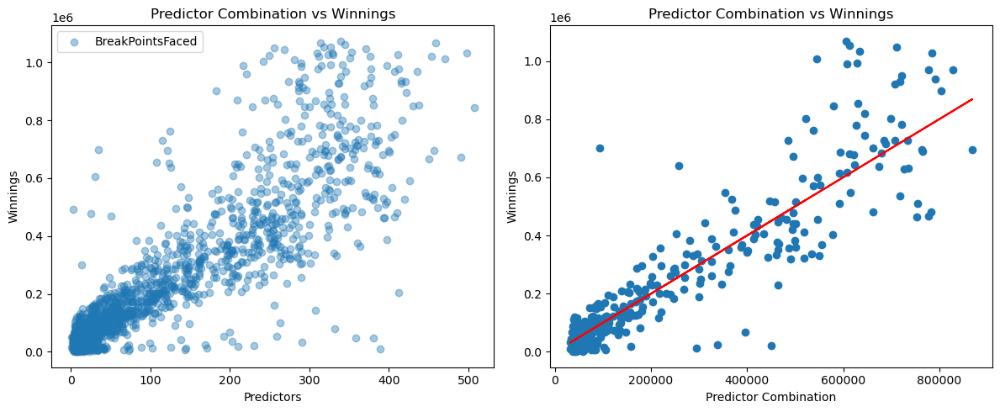

Predictor Combination: ('BreakPointsOpportunities',)
Accuracy: 0.8110138632647594


<Figure size 640x480 with 0 Axes>

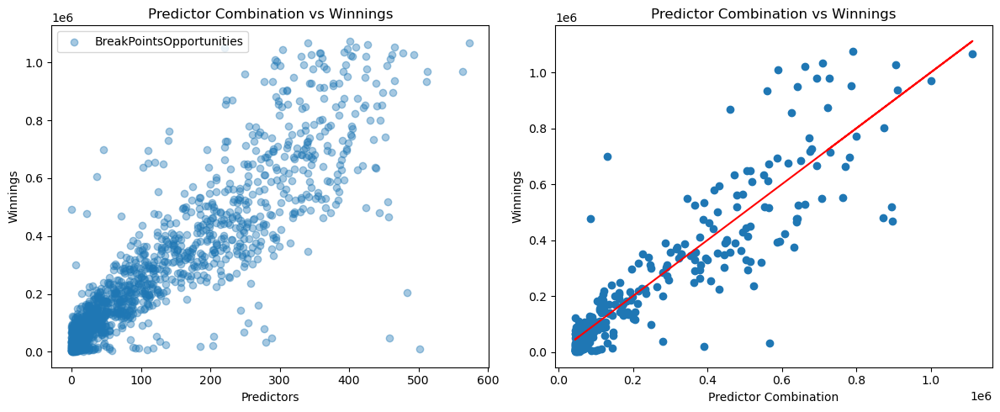

Predictor Combination: ('DoubleFaults',)
Accuracy: 0.7506796896616905


<Figure size 640x480 with 0 Axes>

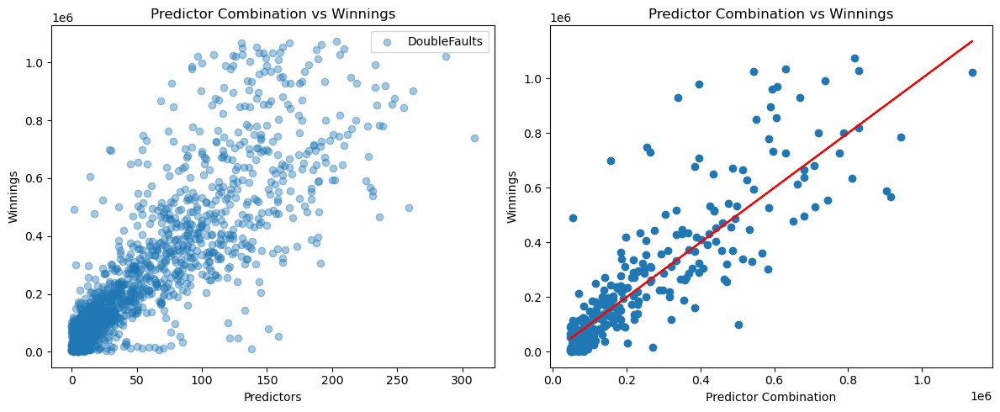

Predictor Combination: ('ReturnGamesPlayed',)
Accuracy: 0.8266774754092294


<Figure size 640x480 with 0 Axes>

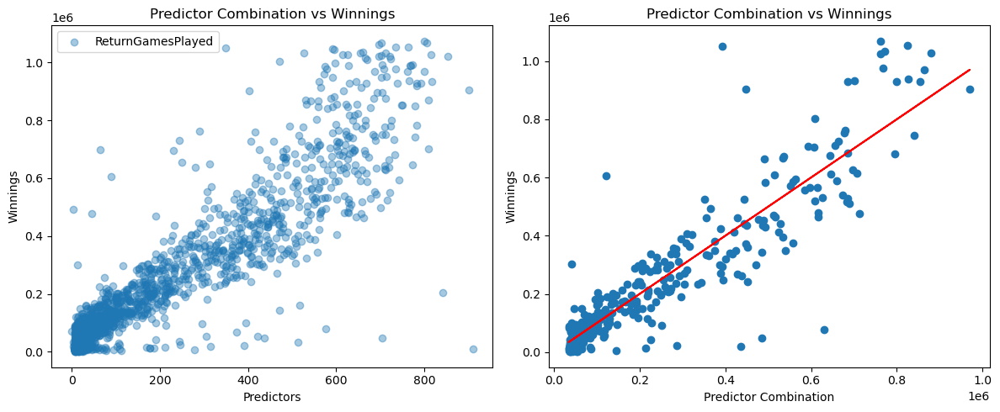

Predictor Combination: ('ServiceGamesPlayed',)
Accuracy: 0.8676513657987851


<Figure size 640x480 with 0 Axes>

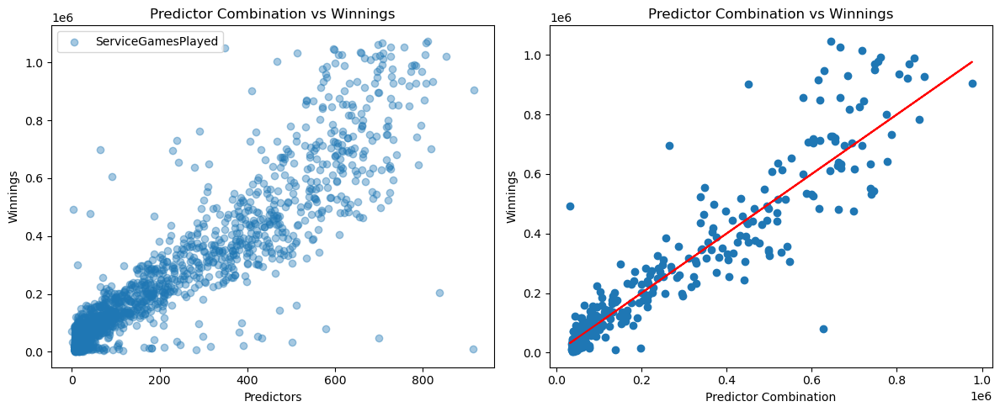

Predictor Combination: ('BreakPointsFaced', 'BreakPointsOpportunities')
Accuracy: 0.8520705026112407


<Figure size 640x480 with 0 Axes>

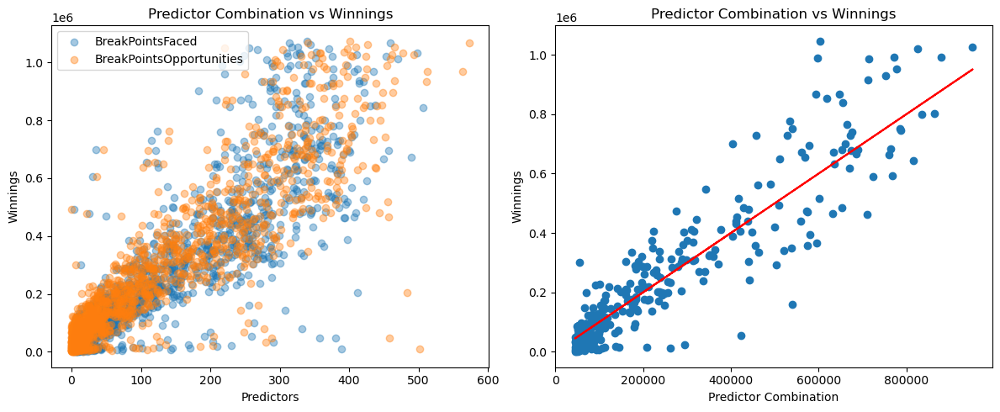

Predictor Combination: ('BreakPointsFaced', 'DoubleFaults')
Accuracy: 0.7483006938343937


<Figure size 640x480 with 0 Axes>

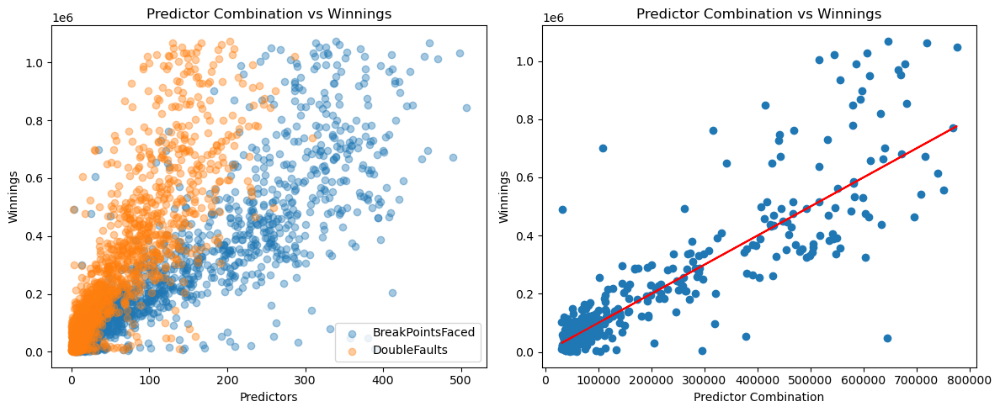

Predictor Combination: ('BreakPointsFaced', 'ReturnGamesPlayed')
Accuracy: 0.8429763456684425


<Figure size 640x480 with 0 Axes>

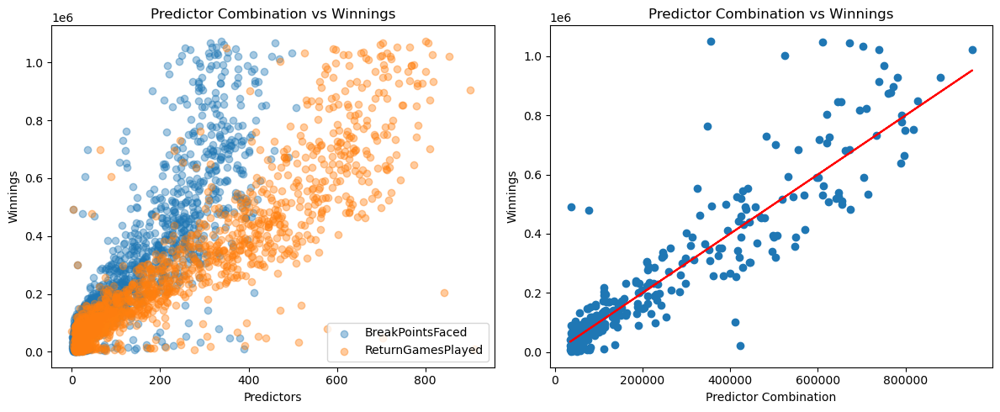

Predictor Combination: ('BreakPointsFaced', 'ServiceGamesPlayed')
Accuracy: 0.7991870319153829


<Figure size 640x480 with 0 Axes>

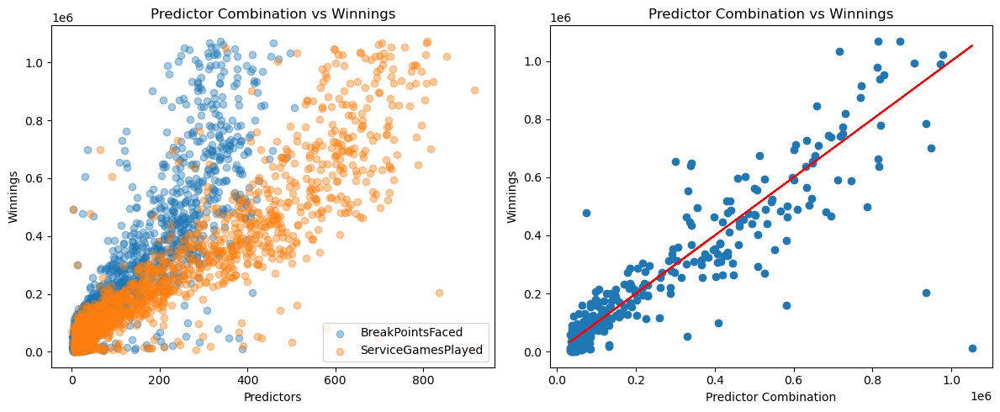

Predictor Combination: ('BreakPointsOpportunities', 'DoubleFaults')
Accuracy: 0.774726705641026


<Figure size 640x480 with 0 Axes>

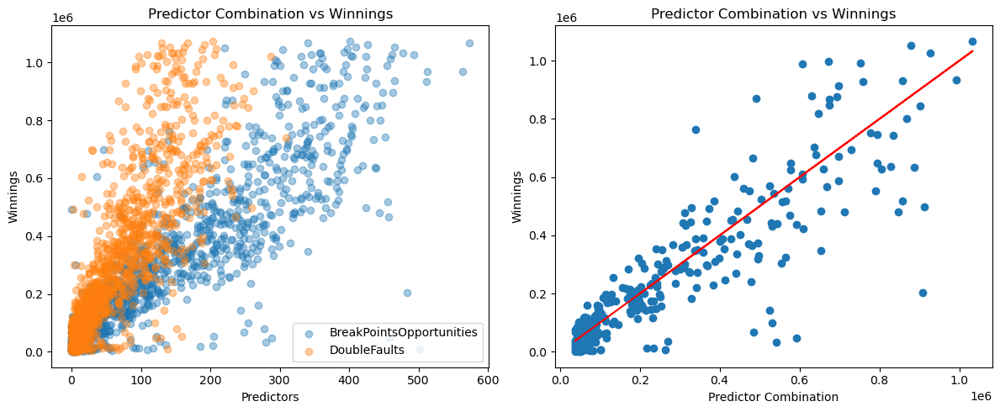

Predictor Combination: ('BreakPointsOpportunities', 'ReturnGamesPlayed')
Accuracy: 0.7766132811617885


<Figure size 640x480 with 0 Axes>

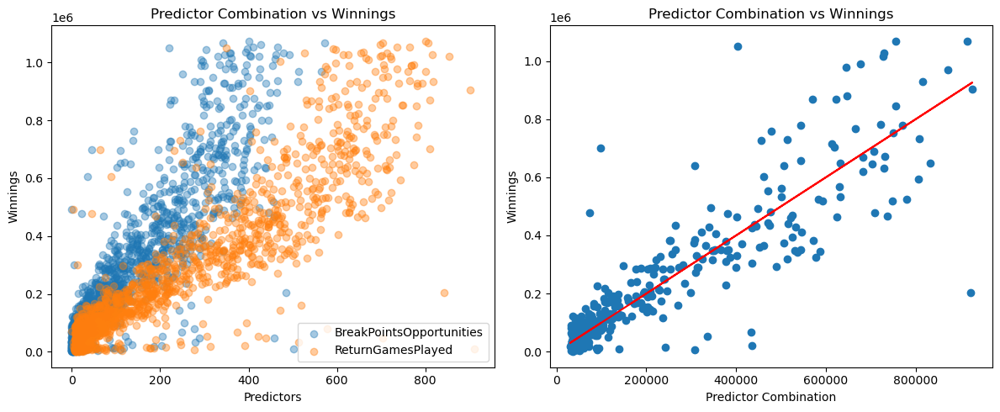

Predictor Combination: ('BreakPointsOpportunities', 'ServiceGamesPlayed')
Accuracy: 0.8577337893999962


<Figure size 640x480 with 0 Axes>

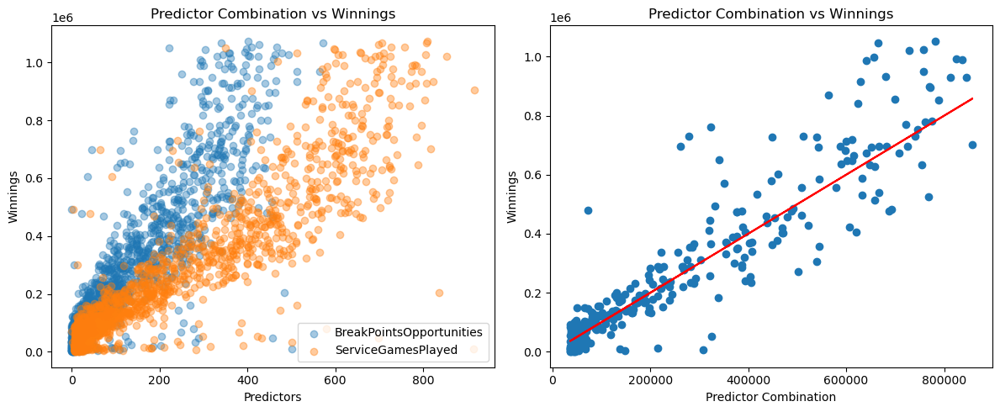

Predictor Combination: ('DoubleFaults', 'ReturnGamesPlayed')
Accuracy: 0.844001388334918


<Figure size 640x480 with 0 Axes>

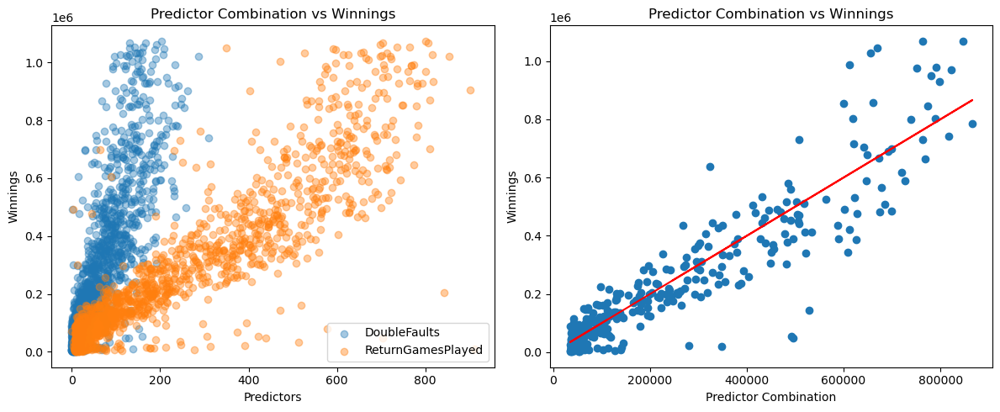

Predictor Combination: ('DoubleFaults', 'ServiceGamesPlayed')
Accuracy: 0.8335950522505913


<Figure size 640x480 with 0 Axes>

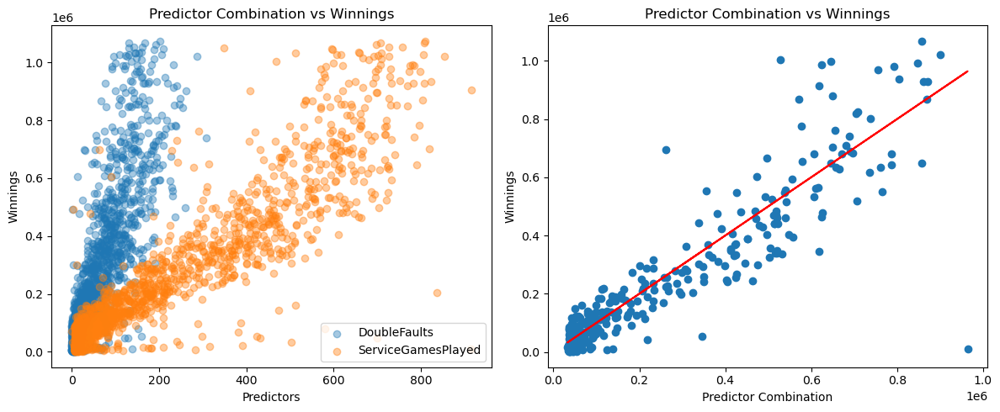

Predictor Combination: ('ReturnGamesPlayed', 'ServiceGamesPlayed')
Accuracy: 0.7947360374274834


<Figure size 640x480 with 0 Axes>

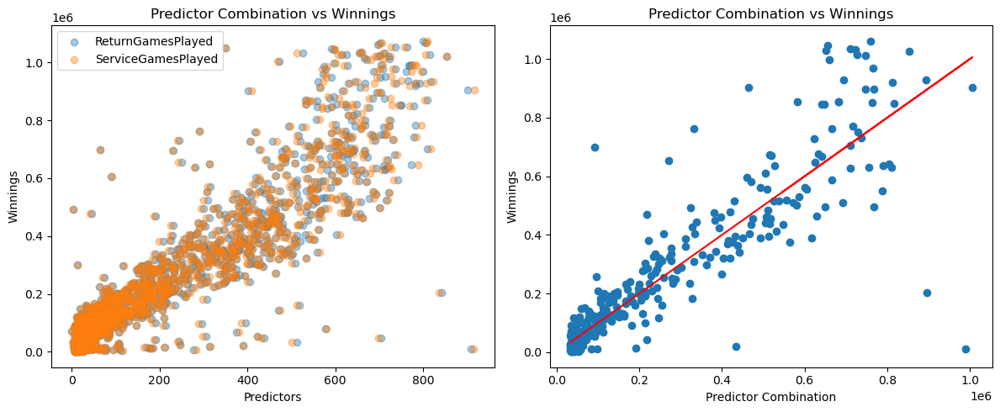

Predictor Combination: ('BreakPointsFaced', 'BreakPointsOpportunities', 'DoubleFaults')
Accuracy: 0.8498311732534006


<Figure size 640x480 with 0 Axes>

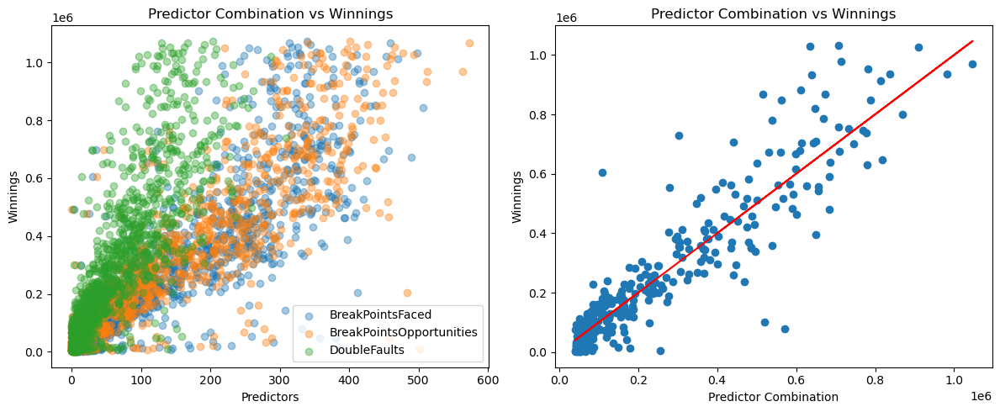

Predictor Combination: ('BreakPointsFaced', 'BreakPointsOpportunities', 'ReturnGamesPlayed')
Accuracy: 0.841679812185518


<Figure size 640x480 with 0 Axes>

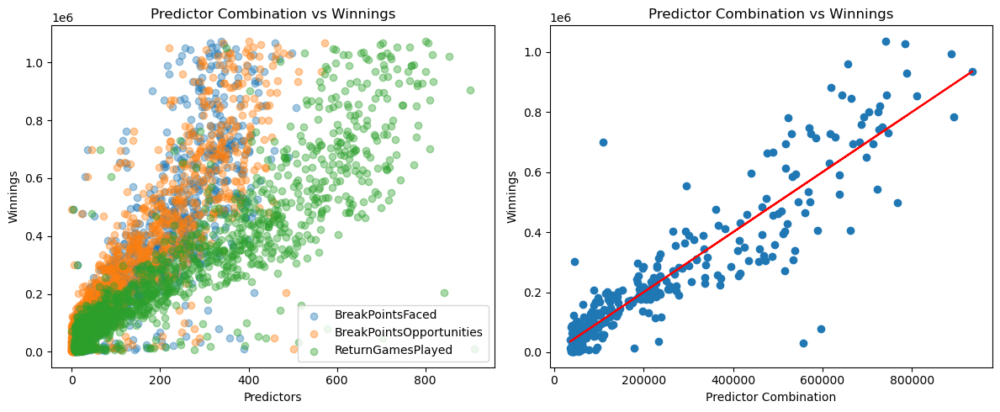

Predictor Combination: ('BreakPointsFaced', 'BreakPointsOpportunities', 'ServiceGamesPlayed')
Accuracy: 0.8535025313561868


<Figure size 640x480 with 0 Axes>

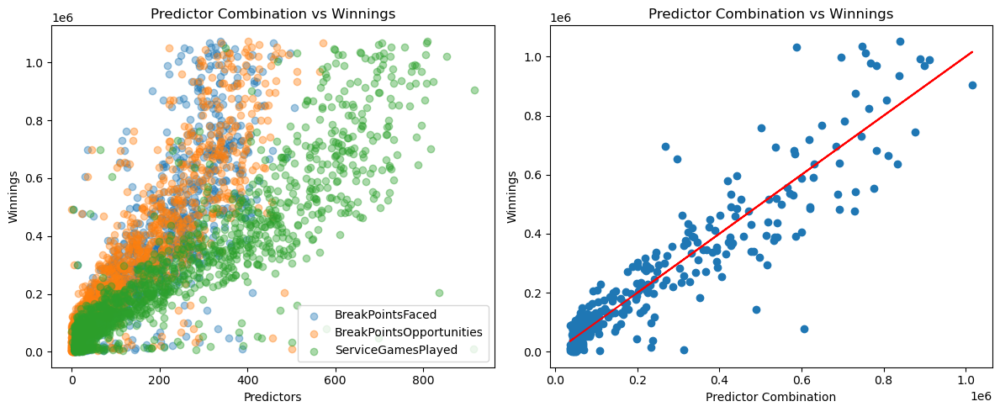

Predictor Combination: ('BreakPointsFaced', 'DoubleFaults', 'ReturnGamesPlayed')
Accuracy: 0.8342002074840771


<Figure size 640x480 with 0 Axes>

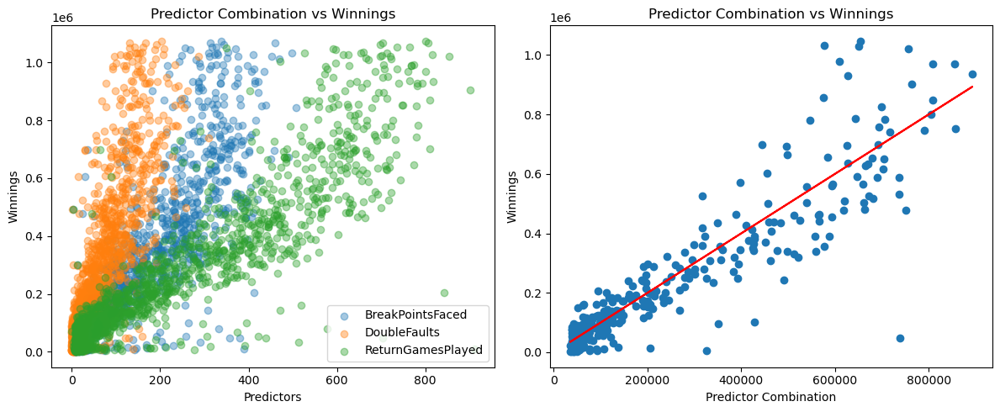

Predictor Combination: ('BreakPointsFaced', 'DoubleFaults', 'ServiceGamesPlayed')
Accuracy: 0.8589378275002881


<Figure size 640x480 with 0 Axes>

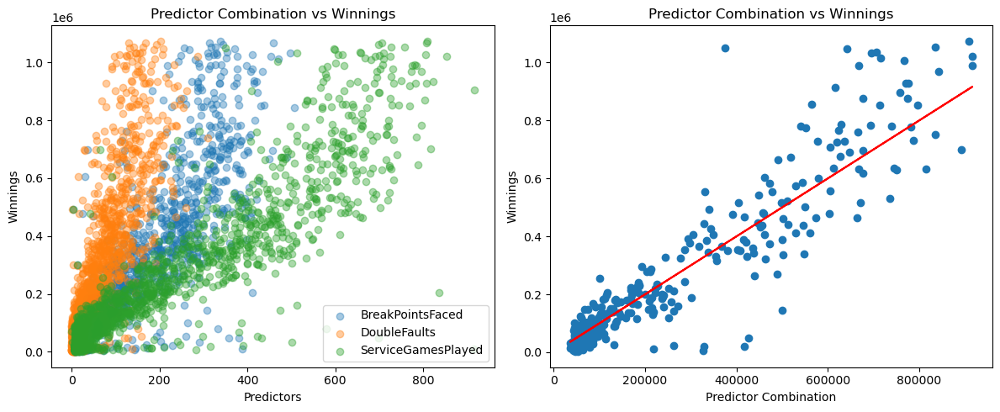

Predictor Combination: ('BreakPointsFaced', 'ReturnGamesPlayed', 'ServiceGamesPlayed')
Accuracy: 0.7580198974167534


<Figure size 640x480 with 0 Axes>

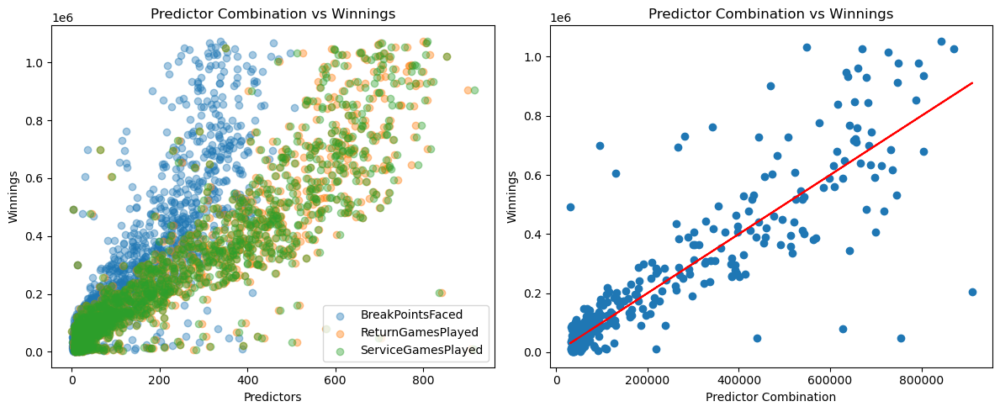

Predictor Combination: ('BreakPointsOpportunities', 'DoubleFaults', 'ReturnGamesPlayed')
Accuracy: 0.8645555992560096


<Figure size 640x480 with 0 Axes>

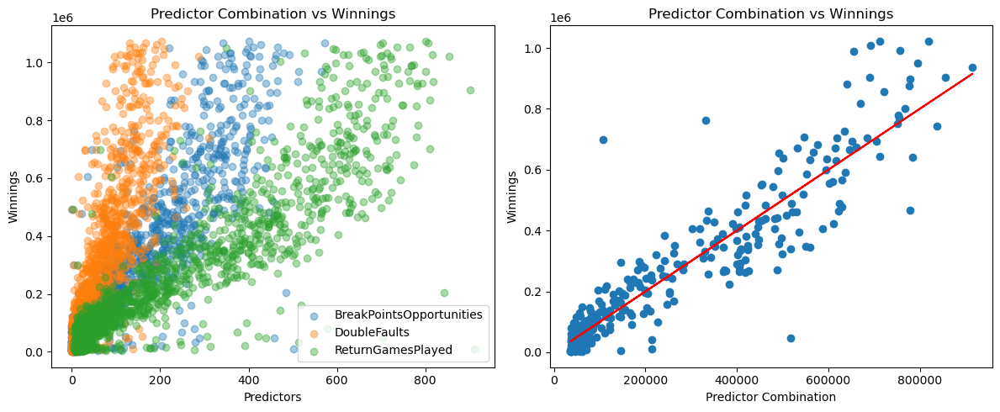

Predictor Combination: ('BreakPointsOpportunities', 'DoubleFaults', 'ServiceGamesPlayed')
Accuracy: 0.861416814857402


<Figure size 640x480 with 0 Axes>

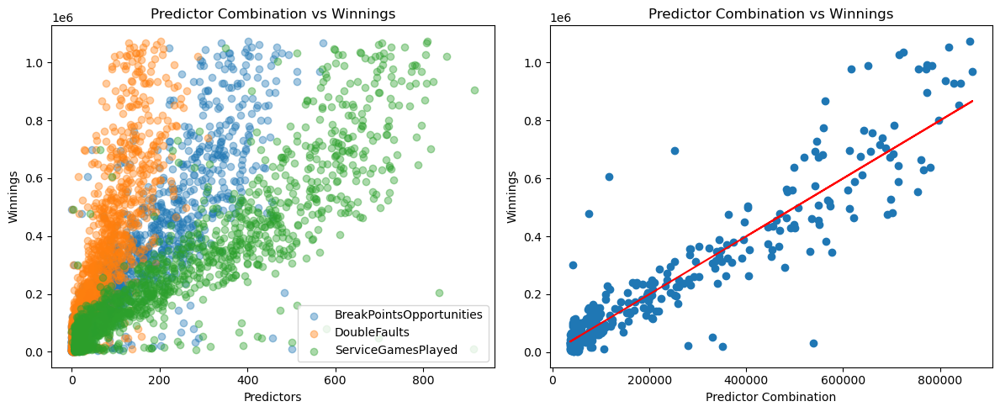

Predictor Combination: ('BreakPointsOpportunities', 'ReturnGamesPlayed', 'ServiceGamesPlayed')
Accuracy: 0.7746452915275721


<Figure size 640x480 with 0 Axes>

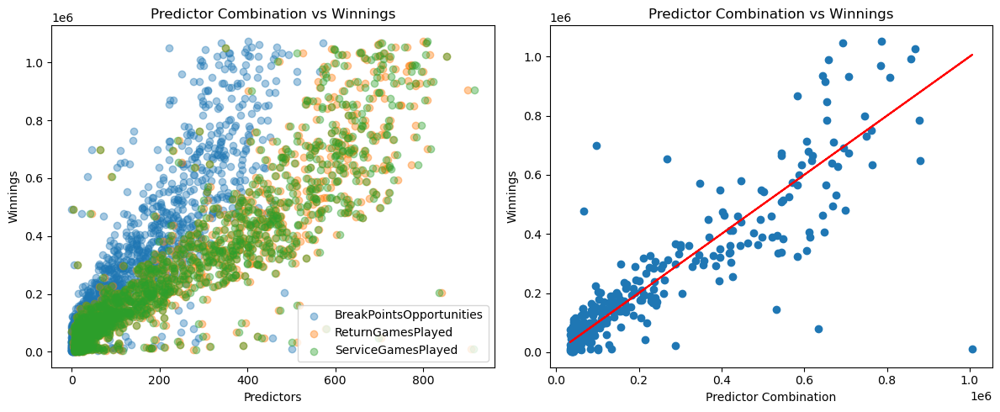

Predictor Combination: ('DoubleFaults', 'ReturnGamesPlayed', 'ServiceGamesPlayed')
Accuracy: 0.8622851189680978


<Figure size 640x480 with 0 Axes>

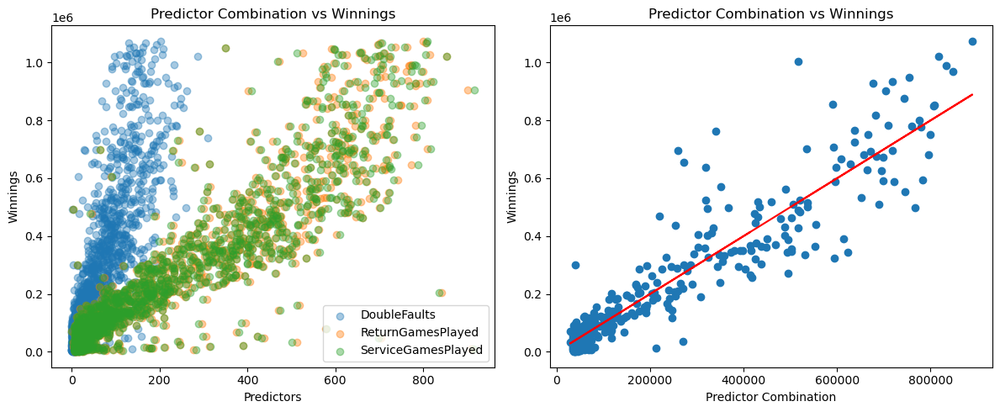

Predictor Combination: ('BreakPointsFaced', 'BreakPointsOpportunities', 'DoubleFaults', 'ReturnGamesPlayed')
Accuracy: 0.8455977340490144


<Figure size 640x480 with 0 Axes>

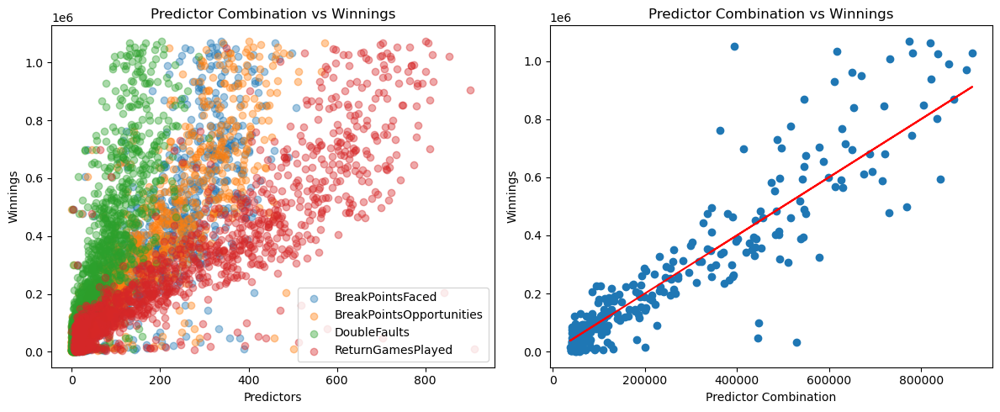

Predictor Combination: ('BreakPointsFaced', 'BreakPointsOpportunities', 'DoubleFaults', 'ServiceGamesPlayed')
Accuracy: 0.807238223998483


<Figure size 640x480 with 0 Axes>

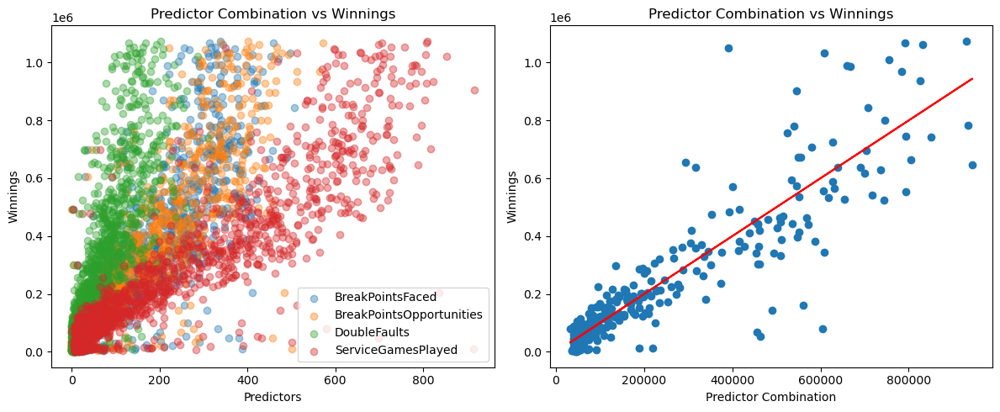

Predictor Combination: ('BreakPointsFaced', 'BreakPointsOpportunities', 'ReturnGamesPlayed', 'ServiceGamesPlayed')
Accuracy: 0.8789405310740177


<Figure size 640x480 with 0 Axes>

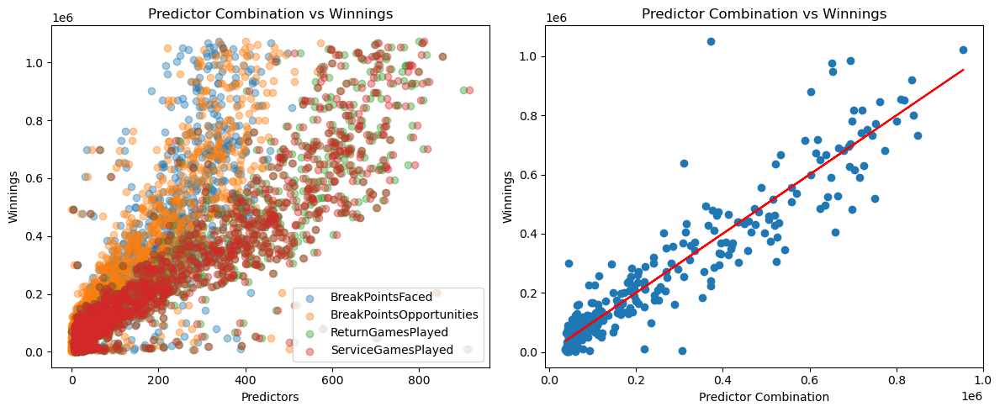

Predictor Combination: ('BreakPointsFaced', 'DoubleFaults', 'ReturnGamesPlayed', 'ServiceGamesPlayed')
Accuracy: 0.8435292102441366


<Figure size 640x480 with 0 Axes>

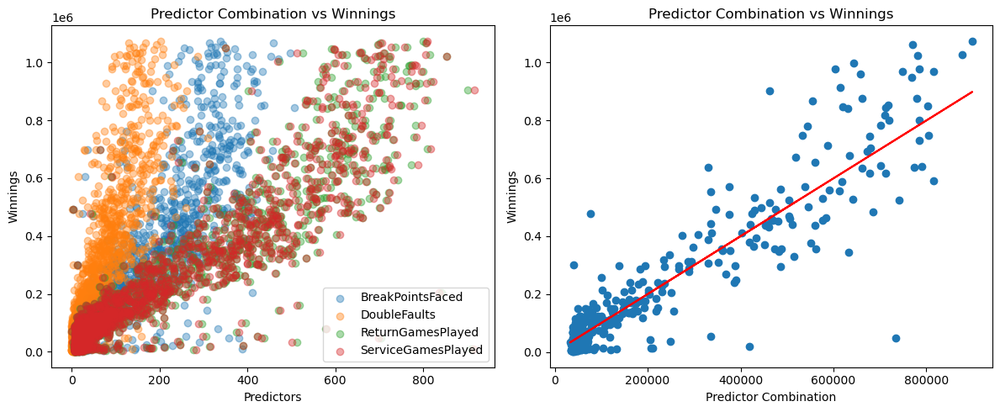

Predictor Combination: ('BreakPointsOpportunities', 'DoubleFaults', 'ReturnGamesPlayed', 'ServiceGamesPlayed')
Accuracy: 0.8632757000295278


<Figure size 640x480 with 0 Axes>

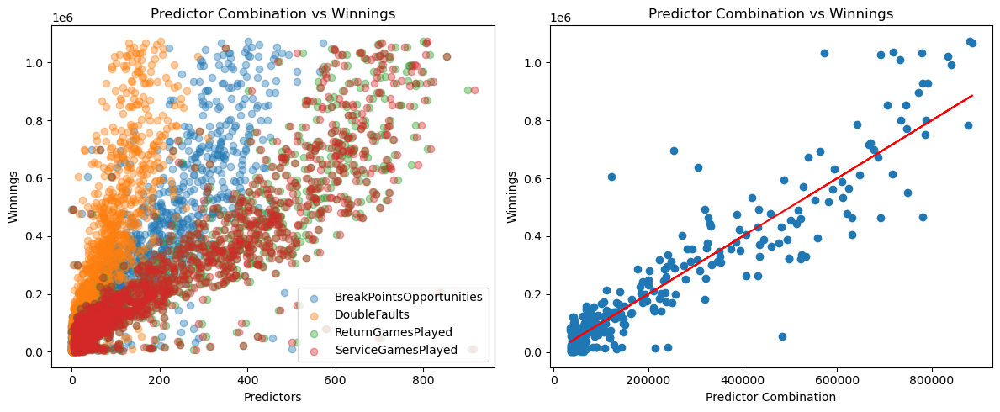

Predictor Combination: ('BreakPointsFaced', 'BreakPointsOpportunities', 'DoubleFaults', 'ReturnGamesPlayed', 'ServiceGamesPlayed')
Accuracy: 0.8182649320444287


<Figure size 640x480 with 0 Axes>

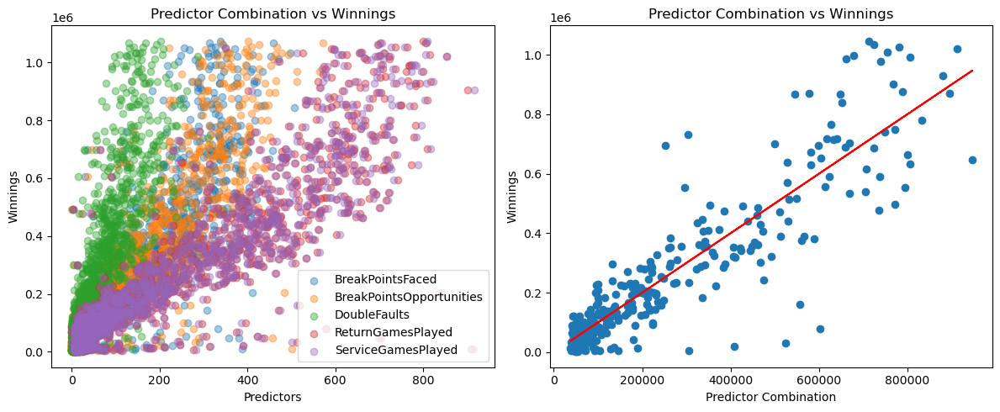

<Figure size 640x480 with 0 Axes>

In [103]:
# List of predictors
predictors_list = ['BreakPointsFaced', 'BreakPointsOpportunities', 'DoubleFaults', 'ReturnGamesPlayed', 'ServiceGamesPlayed']

# List to store accuracy tuples
accuracy_list = []

# Loop through all possible combinations of predictors (up to five predictors)
for combo_length in range(1, 6):
    for predictor_combo in combinations(predictors_list, combo_length):
        features = tennis[list(predictor_combo)]
        outcome = tennis[['Winnings']]
        
        features_train, features_test, outcome_train, outcome_test = train_test_split(features, outcome, train_size=0.8, test_size=0.2)
        
        model = LinearRegression()
        model.fit(features_train, outcome_train)
        
        prediction = model.predict(features_test)
        accuracy = model.score(features_test, outcome_test)
        accuracy_list.append((predictor_combo, accuracy))
        
        print("Predictor Combination:", predictor_combo)
        print("Accuracy:", accuracy)
        
        # Adjust figure size for subplots
        plt.figure(figsize=(12, 5))  # Adjust the figure size here
        
        # Left column scatter plots
        plt.subplot(121)
        for predictor in predictor_combo:
            plt.scatter(tennis[predictor], tennis['Winnings'], alpha=0.4, label=predictor)
        plt.title("Predictor Combination vs Winnings")
        plt.xlabel("Predictors")
        plt.ylabel('Winnings')
        plt.legend()
        
        # Right column scatter plots
        plt.subplot(122)
        plt.scatter(prediction, outcome_test)
        plt.plot(prediction, prediction, color='red') 
        plt.title("Predictor Combination vs Winnings")
        plt.xlabel("Predictor Combination")
        plt.ylabel('Winnings')
        
        # Show the plots
        plt.tight_layout()
        plt.show()
        plt.clf()

In [104]:
# Sort accuracy_list by accuracy values in descending order
sorted_accuracy_list = sorted(accuracy_list, key=lambda x: x[1], reverse=True)

# Create a DataFrame from sorted_accuracy_list
sorted_accuracy_df = pd.DataFrame(sorted_accuracy_list, columns=['Predictor Combination', 'Accuracy'])

pd.set_option('display.max_colwidth', 200)

# Print the DataFrame
sorted_accuracy_df

,Predictor Combination,Accuracy
0,"(BreakPointsFaced, BreakPointsOpportunities, ReturnGamesPlayed, ServiceGamesPlayed)",0.878941
1,"(ServiceGamesPlayed,)",0.867651
2,"(BreakPointsOpportunities, DoubleFaults, ReturnGamesPlayed)",0.864556
3,"(BreakPointsOpportunities, DoubleFaults, ReturnGamesPlayed, ServiceGamesPlayed)",0.863276
4,"(DoubleFaults, ReturnGamesPlayed, ServiceGamesPlayed)",0.862285
5,"(BreakPointsOpportunities, DoubleFaults, ServiceGamesPlayed)",0.861417
6,"(BreakPointsFaced, DoubleFaults, ServiceGamesPlayed)",0.858938
7,"(BreakPointsOpportunities, ServiceGamesPlayed)",0.857734
8,"(BreakPointsFaced, BreakPointsOpportunities, ServiceGamesPlayed)",0.853503
9,"(BreakPointsFaced, BreakPointsOpportunities)",0.852071
